In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
sns.set(palette="deep", font_scale=1.1, rc={"figure.figsize": [8, 5]})
import random
from matplotlib import pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import missingno as msno


## Overview of the data
**Total records:** 5777\
**Total features including Target:** 31

In [4]:
# read the data
df = pd.read_csv('./data/data.csv', sep=";")
df.shape

(5777, 31)

In [5]:
pd.value_counts(df.dtypes)

float64    15
int64      13
object      3
dtype: int64

The following cell creates a list of feature names for Engine Speed and Amb Temperature.

In [6]:
eng_speed = 'EngSpDist_K'
eng_speed_features_placeholders = []
for i in range (1, 15):
    eng_speed_features_placeholders.append(eng_speed+str(i))
print(eng_speed_features_placeholders)


amb_temp = 'AmbTempDist_K'
amb_temp_features_placeholders = []
for i in range (1, 11):
    amb_temp_features_placeholders.append(amb_temp+str(i))
print(amb_temp_features_placeholders)

['EngSpDist_K1', 'EngSpDist_K2', 'EngSpDist_K3', 'EngSpDist_K4', 'EngSpDist_K5', 'EngSpDist_K6', 'EngSpDist_K7', 'EngSpDist_K8', 'EngSpDist_K9', 'EngSpDist_K10', 'EngSpDist_K11', 'EngSpDist_K12', 'EngSpDist_K13', 'EngSpDist_K14']
['AmbTempDist_K1', 'AmbTempDist_K2', 'AmbTempDist_K3', 'AmbTempDist_K4', 'AmbTempDist_K5', 'AmbTempDist_K6', 'AmbTempDist_K7', 'AmbTempDist_K8', 'AmbTempDist_K9', 'AmbTempDist_K10']


### Feature Engineering

After few iterations of the analysis, I realized that features do not have significant predictive power. Therefore, I thought about doing some feature engineering. Although feature engineering process include relevant domain expert, but in this case I am **making some assumptions**. 

Based on my understaning, after reading the presentation, engine speed variables, i.e., EngSpDist_K1 to EngSpDist_K14 are dependent because the engine idles in the area of class K1. In other words, again based on my understanding, that the speed is relatively high in areas like K12 and K13, and gradually decreases as it approaches K1. That's why the rate (slop) of change from K14 to K1 could potentially indicate, or may contain information that could correlate with the dependent variable. If not exactly dependent variable, then may be the combination of features along with slope could form such a plane that could be seperable through models. 

Same analogy and understanding applies to AmbTemp but here temperature increases is it approaches K10. 

The following block of cells calcualte the rate of change (slope) for the temperature and speed features. 

In [7]:
from scipy.stats import linregress

# function to calculate the slope for a given sequence of variables
def calcualte_slope(seq):
    return linregress(list(range(1, len(seq)+1)), seq)[0]

# fuction to get the slopes
def get_slopes(df, features_list):
    slopes = []
    for seq in df[amb_temp_features_placeholders].values:
        slopes.append(calcualte_slope(seq))
    return slopes

In [8]:
# calcualte the slop for speed and temperature variables

slopes_eng_speed = get_slopes(df, eng_speed_features_placeholders)
slopes_amb_temp = get_slopes(df, amb_temp_features_placeholders)

In [9]:
df['SlopeAmbTempDist'] = slopes_amb_temp
df['SlopeEngSpDist'] = slopes_eng_speed

Two more features added, i.e., rate of change.

In [10]:
df.shape

(5777, 33)


Some features have **low STD**, e.g., ***AmbTempDist_K3***, ***AmbTempDist_K4***. We will look into the variance of variables for further investigation. ***PSEUDO_VIN*** has 5777 unique values, so it might not be a useful feature for modeling. 

In [16]:
df.describe()

,PSEUDO_VIN,TONDUR,EngSpDist_K1,EngSpDist_K2,EngSpDist_K3,EngSpDist_K4,EngSpDist_K5,EngSpDist_K6,EngSpDist_K7,EngSpDist_K8,...,AmbTempDist_K5,AmbTempDist_K6,AmbTempDist_K7,AmbTempDist_K8,AmbTempDist_K9,AmbTempDist_K10,MILEAGE,TACHOMETER_IN_KM,SlopeAmbTempDist,SlopeEngSpDist
count,5777.000000,5.777000e+03,5.777000e+03,5.777000e+03,5.777000e+03,5777.000000,5777.000000,5777.000000,5777.000000,5777.000000,...,5777.000000,5777.000000,5777.000000,5777.000000,5777.000000,5777.000000,5777.000000,336.000000,5777.000000,5777.000000
mean,2889.000000,1.638604e+06,6.949810e+05,5.659570e+05,1.523329e+05,17916.948520,2744.953176,769.363095,343.032404,181.538982,...,11.718885,107.391726,331.057989,507.202527,194.065605,12.809070,13322.323524,30366.226190,30.880333,30.880333
std,1667.820584,1.478634e+06,7.280069e+05,5.510523e+05,1.698033e+05,31982.030334,6069.909116,1871.395346,803.763476,481.114263,...,43.497786,182.867761,330.765296,447.363231,282.863019,40.439852,13254.917856,17811.425833,26.234382,26.234382
min,1.000000,1.692310e+04,4.641300e+03,4.066000e+02,3.030000e+01,10.400000,3.400000,0.900000,0.200000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1002.000000,1873.000000,0.939394,0.939394
25%,1445.000000,6.443811e+05,2.352837e+05,1.947698e+05,4.601980e+04,3302.400000,609.400000,88.600000,33.900000,15.400000,...,0.000000,10.000000,113.000000,206.000000,19.000000,0.000000,4485.000000,17586.250000,12.751515,12.751515
50%,2889.000000,1.167932e+06,4.634370e+05,3.886051e+05,9.958480e+04,8232.300000,1166.800000,261.900000,103.900000,47.700000,...,0.000000,36.000000,226.000000,376.000000,87.000000,0.000000,9330.000000,26821.000000,22.739394,22.739394
75%,4333.000000,2.111713e+06,8.623770e+05,7.292884e+05,1.953351e+05,19650.900000,2629.400000,753.300000,319.200000,153.100000,...,4.000000,128.000000,433.000000,652.000000,250.000000,4.000000,17187.000000,40978.000000,40.400000,40.400000
max,5777.000000,1.151146e+07,6.959281e+06,4.262310e+06,2.453757e+06,646982.900000,152502.200000,74583.600000,25328.500000,16623.100000,...,1016.000000,2592.000000,3874.000000,5947.000000,2579.000000,685.000000,157940.000000,115314.000000,246.763636,246.763636


There are three non-numeric features in the variable including target variable.

In [17]:
df.select_dtypes(exclude="number").head()

,DIAGNOSIS_DATE,REPAIR_DATE,LABEL
0,03.06.14,NaN,NO_DAMAGE
1,10.08.15,NaN,NO_DAMAGE
2,30.01.15,NaN,NO_DAMAGE
3,02.04.15,NaN,NO_DAMAGE
4,23.11.15,NaN,NO_DAMAGE


Highly imbalanced dataset, ~6% records are available for ***DAMAGE*** class, sampling techniques are required for this problem.

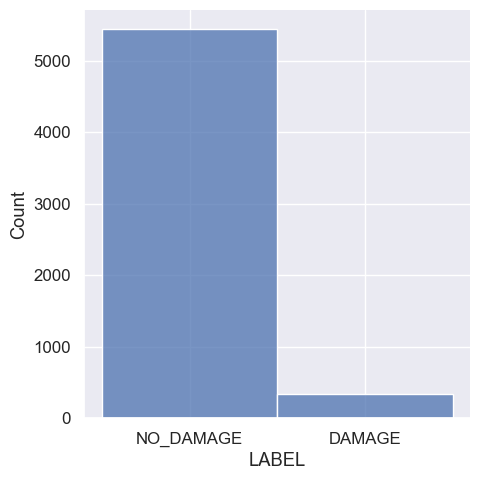

In [18]:
sns.displot(data=df, x="LABEL")

In [19]:
damage=df[df["LABEL"]=='DAMAGE']  
no_damage=df[df["LABEL"]=='NO_DAMAGE'] 
print(f"Only {round(damage.shape[0]/len(df)*100,2)}% of damage records are avaible.")


Only 5.82% of damage records are avaible.


***REPAIR_DATE*** and ***TACHOMETER_IN_KM*** has too many missing values.

In [20]:
df.isna().sum()

PSEUDO_VIN             0
TONDUR                 0
EngSpDist_K1           0
EngSpDist_K2           0
EngSpDist_K3           0
EngSpDist_K4           0
EngSpDist_K5           0
EngSpDist_K6           0
EngSpDist_K7           0
EngSpDist_K8           0
EngSpDist_K9           0
EngSpDist_K10          0
EngSpDist_K11          0
EngSpDist_K12          0
EngSpDist_K13          0
EngSpDist_K14          0
AmbTempDist_K1         0
AmbTempDist_K2         0
AmbTempDist_K3         0
AmbTempDist_K4         0
AmbTempDist_K5         0
AmbTempDist_K6         0
AmbTempDist_K7         0
AmbTempDist_K8         0
AmbTempDist_K9         0
AmbTempDist_K10        0
MILEAGE                0
DIAGNOSIS_DATE         0
REPAIR_DATE         5441
TACHOMETER_IN_KM    5441
LABEL                  0
SlopeAmbTempDist       0
SlopeEngSpDist         0
dtype: int64

### Data Sparsity

Let's plot missing values through missigno. It looks most of the data is complete with the exception of two features ***REPAIRE_DATE*** and ***TACHOMETER_IN_KM***.

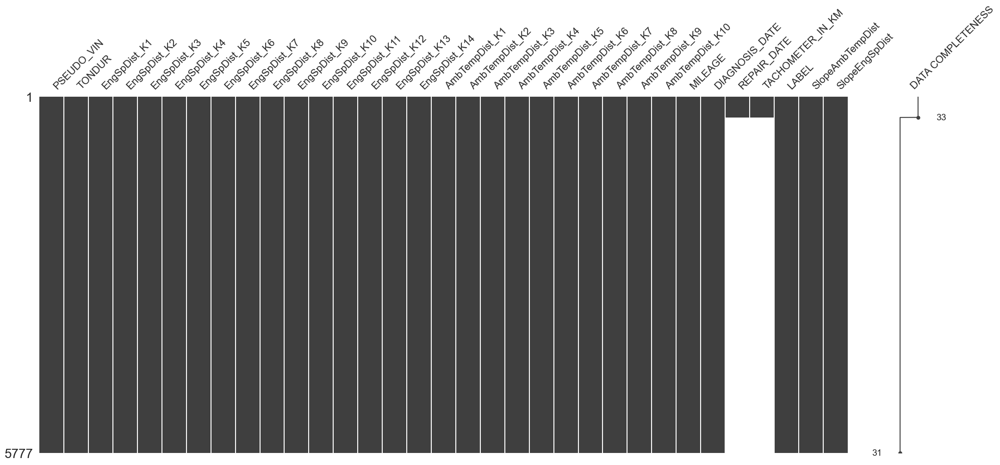

In [21]:
msno.matrix(df, labels=True, sort="descending");

Let's quantify the missing data information in terms of percentage for each feature. Surely, more than 80% of the data is missing for two features.

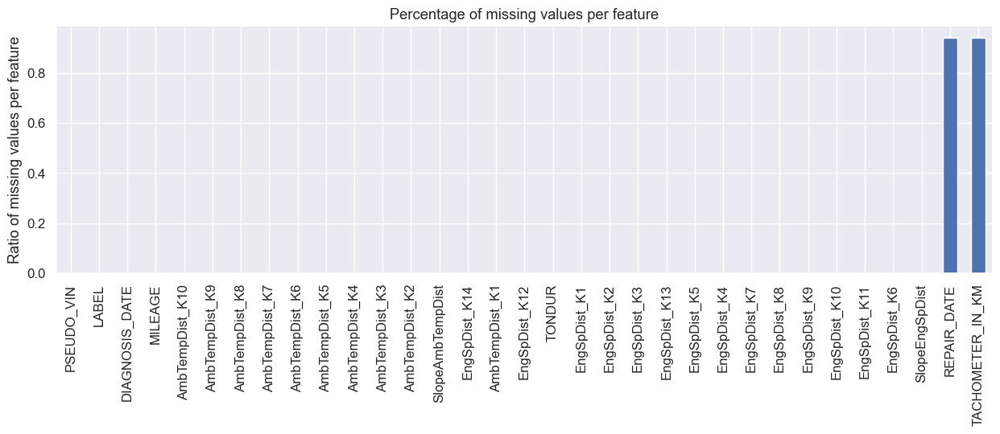

In [22]:
df.isna().mean().sort_values().plot(
    kind="bar", figsize=(15, 4),
    title="Percentage of missing values per feature",
    ylabel="Ratio of missing values per feature");

Given the problem we can drop these two variables for two reason: **i)** it contains too much missing data so it doesn't bring information into the modeling. Even though we can apply replacement methodologies but with this amount of missing data, I'd rather remove those features as replacement methods, e.g., averages, etc, would still result in low variance. **ii)** According to my understanding of these two features ***REPAIR_DATE*** is the day when vehicle was repaired, this feature would highly useful if we had actual values for this as we can calculate the number of days through ***DIAGNOSIS_DATE*** and ***REPAIR_DATE*** features which might result in high correlation to the target variable. Same goes for the feature ***TACHOMETER_IN_KM***, this features might have high correlation if it would have been recorded. Moreover, with this amount of data missing, I would missing, these were not considered relevant, consequently, not recorded at all. Remove these features along with ***PSEUDO_VIN***, which is unique identifier.

In [23]:
df_complete_data = df.drop(['REPAIR_DATE', 'TACHOMETER_IN_KM', 'DIAGNOSIS_DATE', 'PSEUDO_VIN'], axis=1)

In [24]:
df_complete_data.shape

(5777, 29)

### Data Variance
Plot unique values per feature to overview the variance of features. We can see that ***TONDUR*** along with other features have alot of unique values which means high variance, whereas, ***EngSpDist_K14*** and other features from left have low number of unique values.

<AxesSubplot: title={'center': 'Unique values per feature'}>

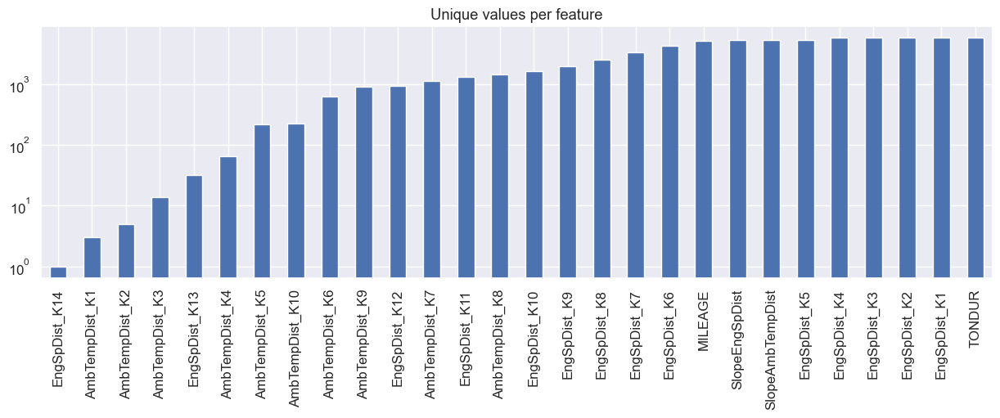

In [25]:
unique_values = df_complete_data.select_dtypes(include="number").nunique().sort_values()
unique_values.plot.bar(logy=True, figsize=(15, 4), title="Unique values per feature")

The variance of each feature shows that ***EngSpDist_K14*** have the least variance along with other few features, it is supported by our previous analysis. We can keep high variance features at the moment because these features might bring information when correlated with other features. We will look into scatter plots for this analysis. For now we decide to make a ***cut off*** at ***AmbTempDist_K14*** from left of the following graph and drop these features.

<AxesSubplot: title={'center': 'Variance per feature'}>

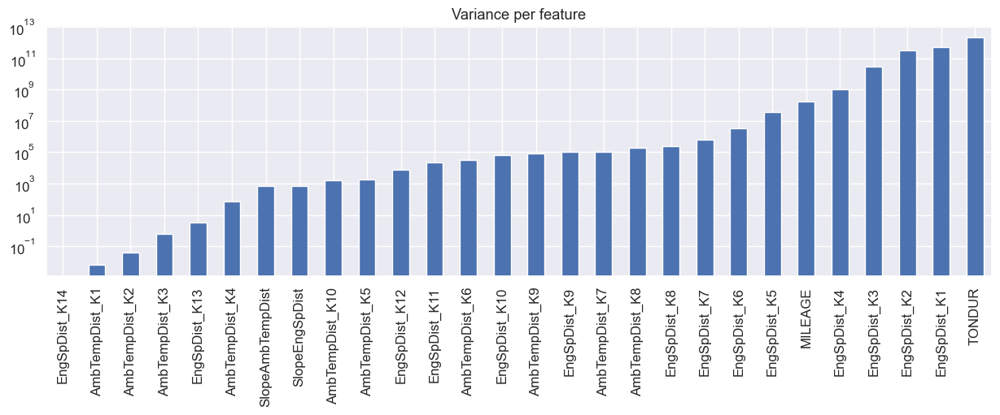

In [26]:
df_complete_data.var().sort_values().plot.bar(logy=True, figsize=(15, 4), title="Variance per feature")

In [27]:
df_low_var_features_dropped = df_complete_data.drop(columns=['EngSpDist_K14', 'AmbTempDist_K1', 'AmbTempDist_K2', 'AmbTempDist_K3', 'EngSpDist_K13', 'AmbTempDist_K4'])

### Duplicate records

There are no duplicate records in the remaining dataset.

In [28]:
n_duplicates = df_low_var_features_dropped.duplicated().sum()
print(f"Duplicate recordrs: {n_duplicates}")

Duplicate recordrs: 0


### Recording Errors

Let's look for recording errors in the dataset. The following plot shows the data point for each values, where x-axis is the index and y-axis the feature values. We can see there are number of outliers for almost every feature, however, the overall graph shows that the values are in specific ranges, so no recroding errors are presented according to my understanding.

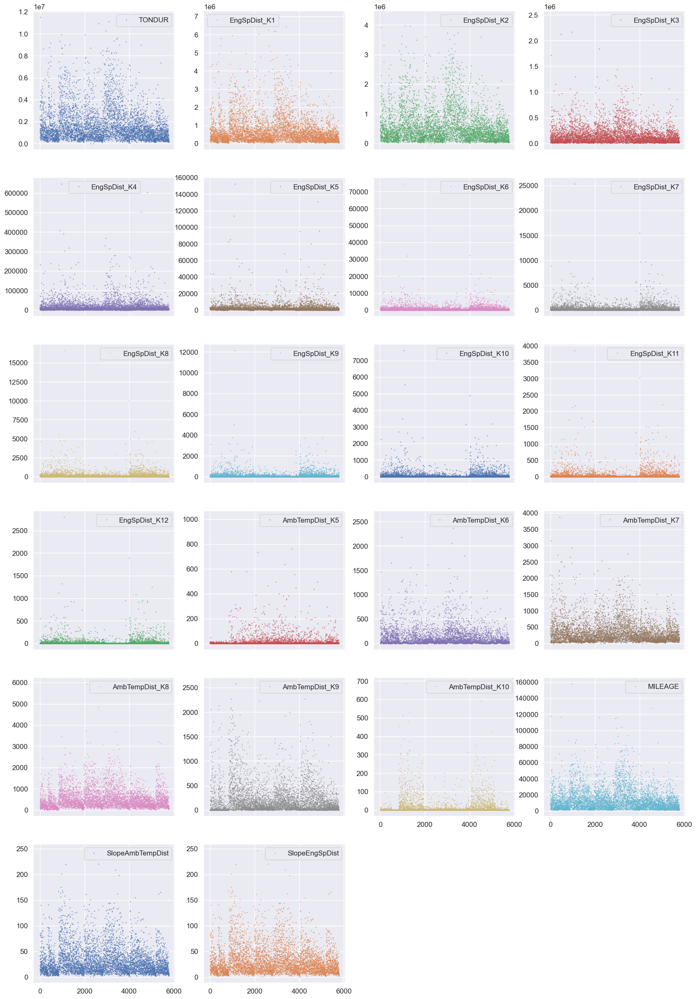

In [29]:
df_low_var_features_dropped.plot(lw=0, marker=".", subplots=True, layout=(-1, 4),
          figsize=(20, 30), markersize=1);

### Data Distribution
The following histogram shows that all the features are extremely positively skewed. We will need transformation techniuqes to handle the right skewed distribution.

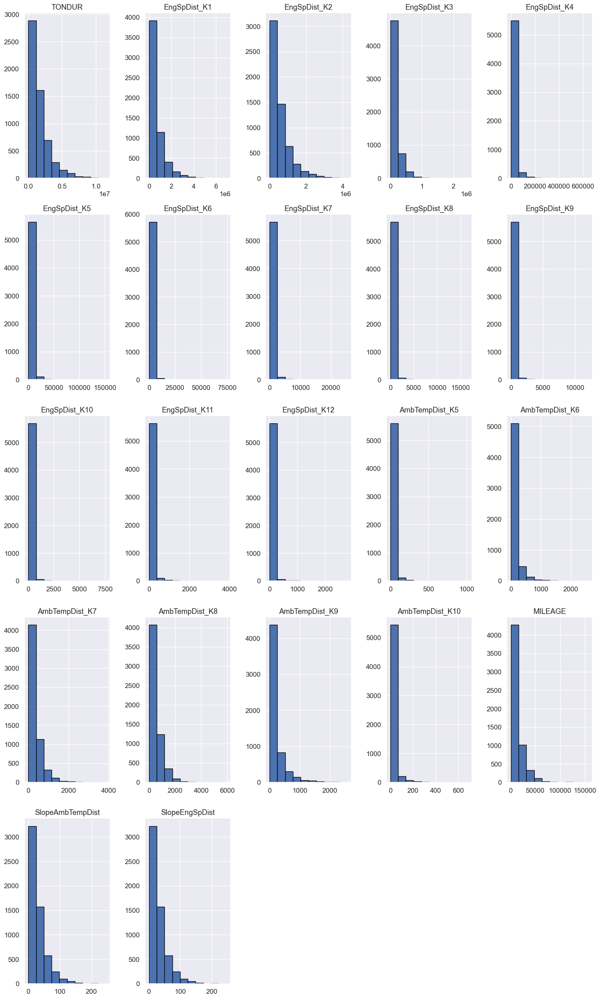

In [30]:
df_low_var_features_dropped.hist(bins=10, figsize=(15, 25), layout=(-1, 5), edgecolor="black")
plt.tight_layout();

### Scatter Pair-Plots


In [31]:
#define helper function for pairplot
def pairplot_helper(df_pairplot, idx_start_features, idx_end_features):
    features = list(df_pairplot.keys())
    features.remove("LABEL")
    sns.pairplot(df_low_var_features_dropped[features[idx_start_features:idx_end_features]+['LABEL']], hue="LABEL", height=2.5)

The following graphs show the scatter plot of the variables based on the target variable. Overall it looks most of the features seem to have no linear sepepartion, we might need non-linear models. Moreover, there are high correlation with among variables, for instance, ***TONDOUR*** with ***EngSpDist_K1*** and ***EngSpDist_K2***. We can quantify this through pearson correlation in the later part and potentially remove one of the features among highly correlated features.

In [34]:
df_low_var_features_dropped.shape

(5777, 23)

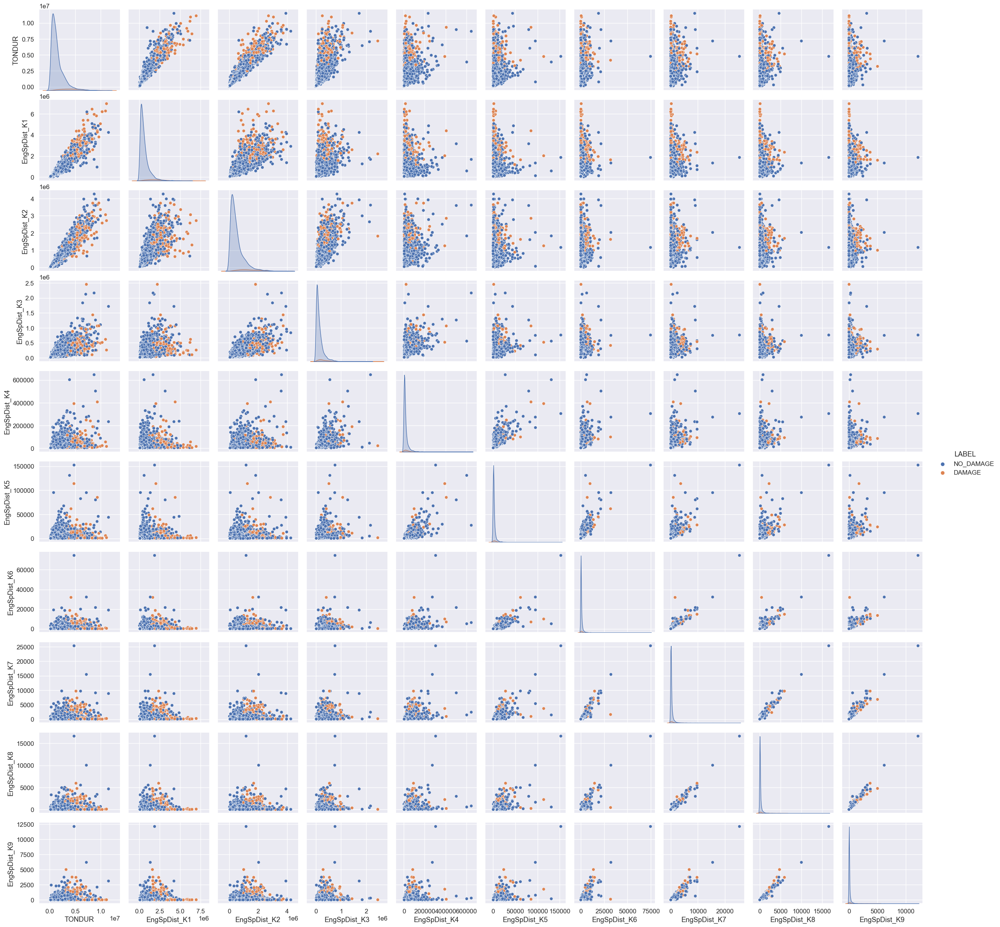

In [35]:
# plotting for first 10 features
pairplot_helper(df_low_var_features_dropped, 0, 10)

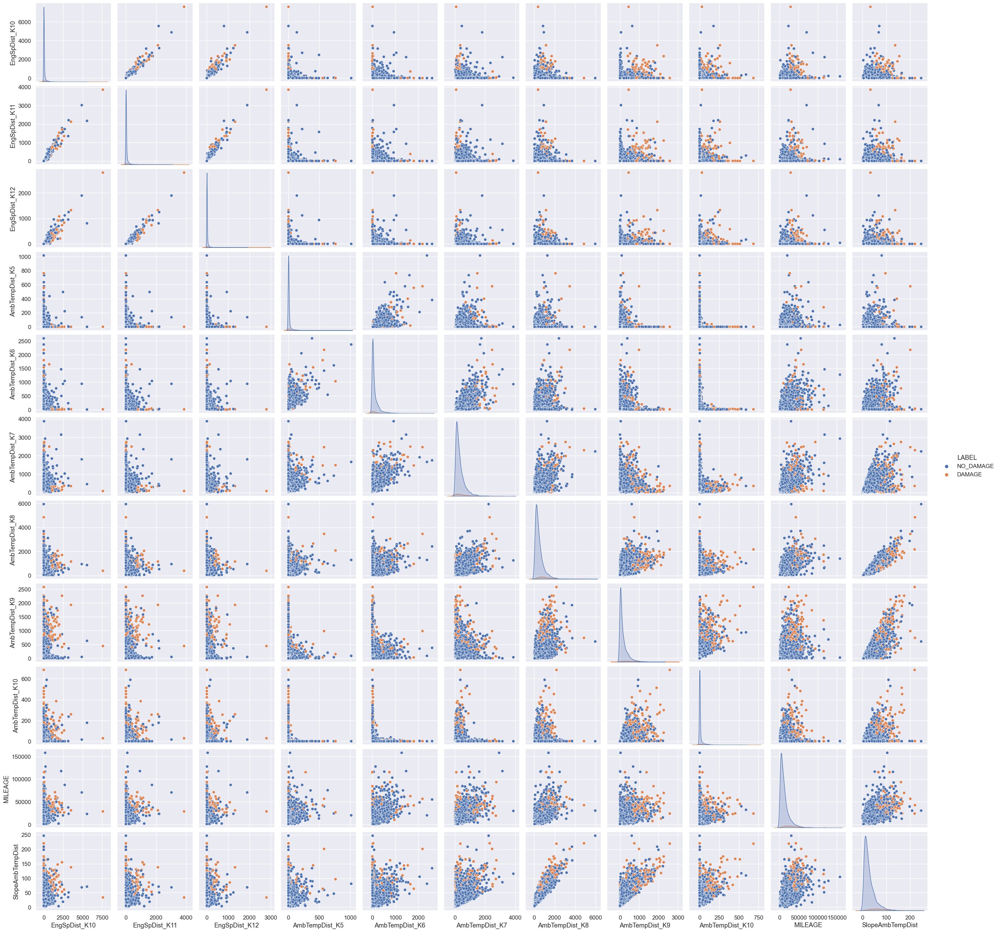

In [36]:
# plotting for first last 11 features
pairplot_helper(df_low_var_features_dropped, 10, 21)

### Correlation Analysis
The following blocks of cells anlayze the corelation among variables through pearson method.

In [37]:
df_corr = df_low_var_features_dropped.corr(method="pearson")

The following heatmap shows that are many features that are highly correlated. We can drop few features after the quantification of the correlation analysis. 

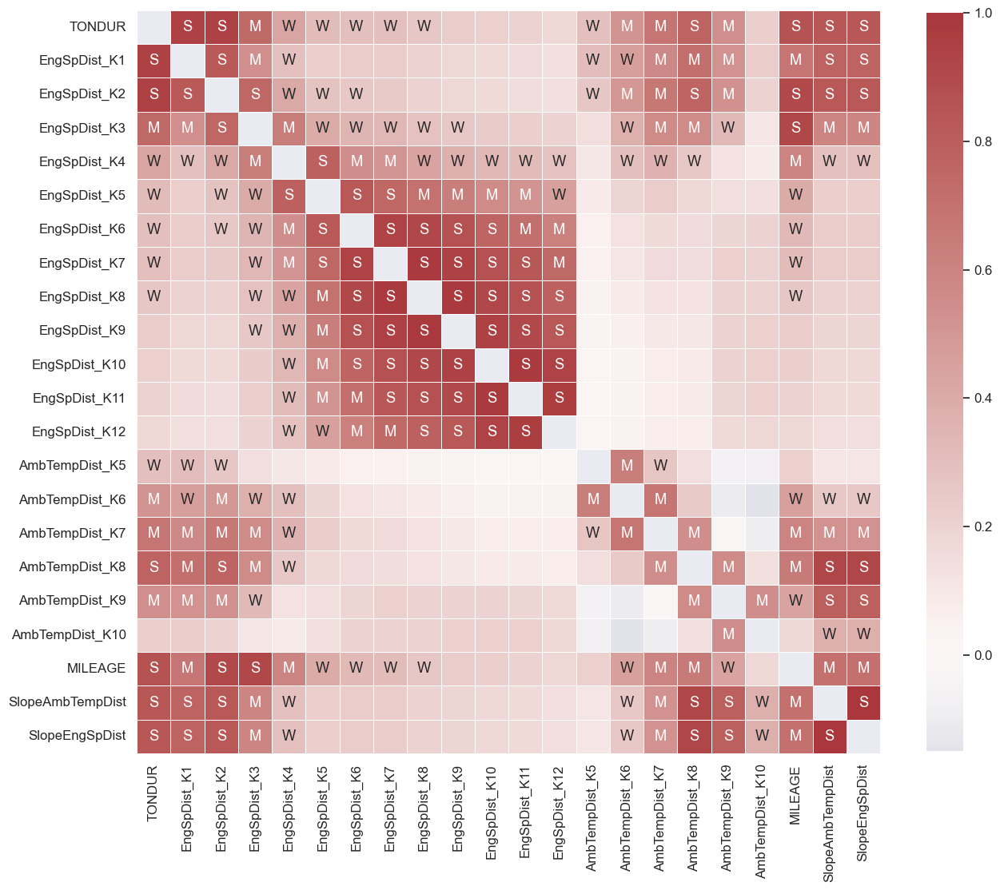

In [38]:
labels = np.where(np.abs(df_corr)>0.75, "S",
                  np.where(np.abs(df_corr)>0.5, "M",
                           np.where(np.abs(df_corr)>0.25, "W", "")))

# Plot correlation matrix
plt.figure(figsize=(15, 15))
sns.heatmap(df_corr, mask=np.eye(len(df_corr)), square=True,
            center=0, annot=labels, fmt='', linewidths=.5,
            cmap="vlag", cbar_kws={"shrink": 0.8});

In [39]:
df_corr_abs = df_low_var_features_dropped.corr(method="pearson").abs()
upper_triangle = df_corr_abs.where(np.triu(np.ones(df_corr_abs.shape), k=1).astype(np.bool))
to_drop = [column for column in upper_triangle.columns if any(upper_triangle[column] > 0.95)]
to_drop

['EngSpDist_K8',
 'EngSpDist_K9',
 'EngSpDist_K10',
 'EngSpDist_K11',
 'EngSpDist_K12',
 'SlopeEngSpDist']

The following features could be dropped based on the threshold, i.e., >95%.

In [40]:
df_features_dropped_correlation = df_low_var_features_dropped.drop(columns=to_drop, axis=1)

16 features are left including target variable.

In [41]:
df_features_dropped_correlation.shape

(5777, 17)

### Skew Analsys
Previously we noticed that the values are extremely right skewed. It is supported through the following analysis, i.e., for each variable we have positive skew values for all the features. We could transform the features through log transform and see if we are able to transform the data to more or less normal distribution.

In [42]:
old_skew = df_features_dropped_correlation.skew().sort_values(ascending=False)
old_skew

EngSpDist_K6        15.091755
EngSpDist_K5        10.239829
EngSpDist_K7        10.158493
AmbTempDist_K5       8.890287
EngSpDist_K4         6.772806
AmbTempDist_K10      6.094272
AmbTempDist_K6       4.104086
EngSpDist_K3         3.352739
AmbTempDist_K9       2.867396
EngSpDist_K1         2.677670
AmbTempDist_K7       2.596827
MILEAGE              2.536436
AmbTempDist_K8       2.309297
EngSpDist_K2         2.091452
TONDUR               2.062756
SlopeAmbTempDist     2.038381
dtype: float64

In [43]:
from sklearn.preprocessing import FunctionTransformer
from sklearn.compose import ColumnTransformer

The following graphs for each feature show that log transformation transform the data to normal distribution to some extent. For some variables, e.g., ***EngSpDist_K7***, ***EngSpDist_K6***, and ***EngSpDist_K5*** it does a pretty well job.

TONDUR


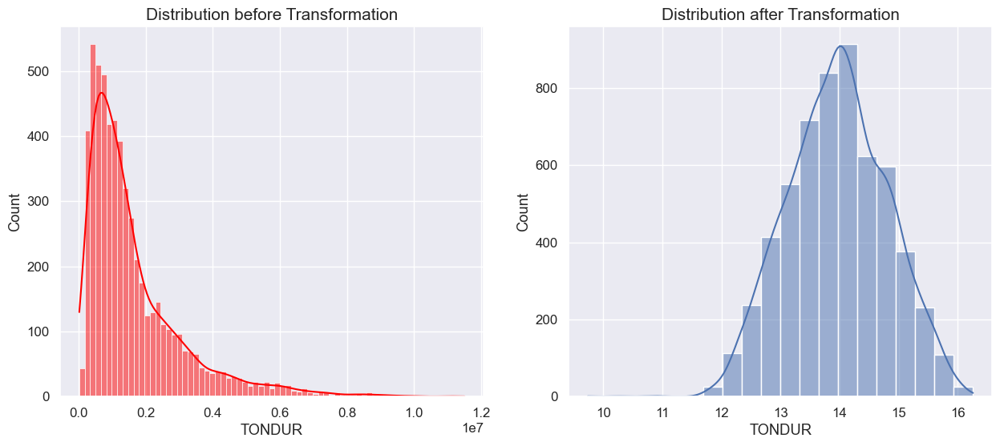

Skewness was 2.06 before & is -0.03 after Log transformation.
EngSpDist_K1


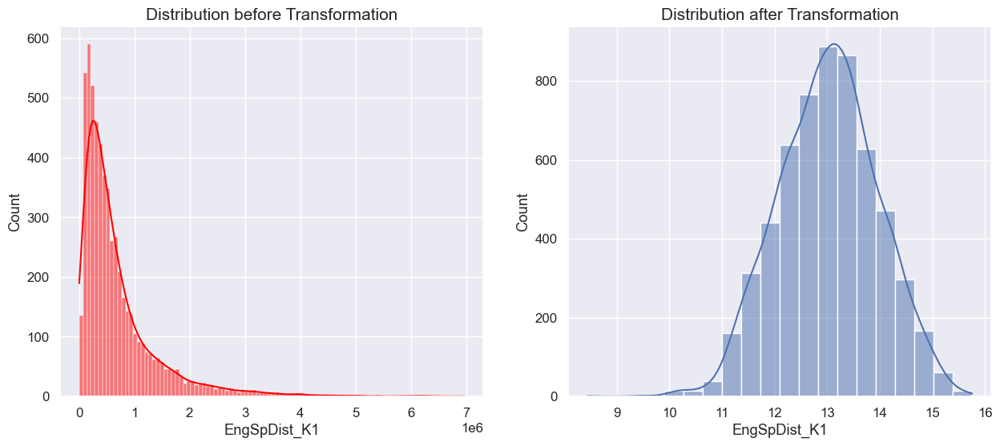

Skewness was 2.68 before & is -0.08 after Log transformation.
EngSpDist_K2


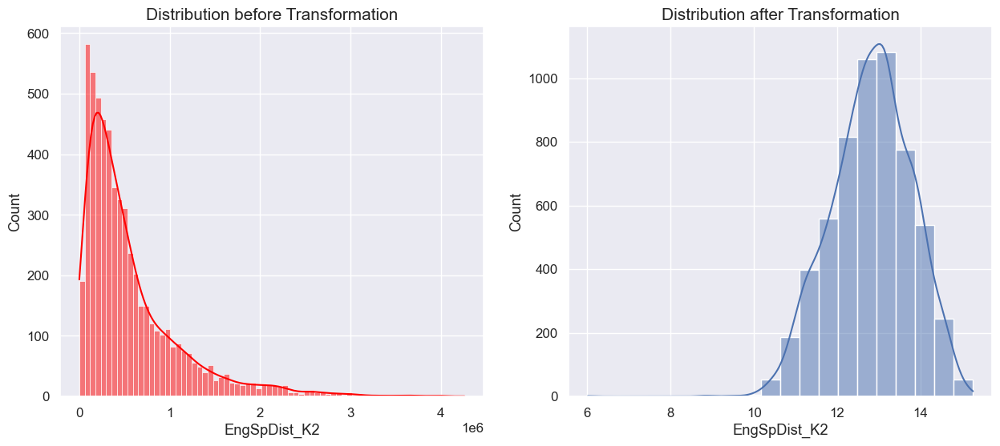

Skewness was 2.09 before & is -0.26 after Log transformation.
EngSpDist_K3


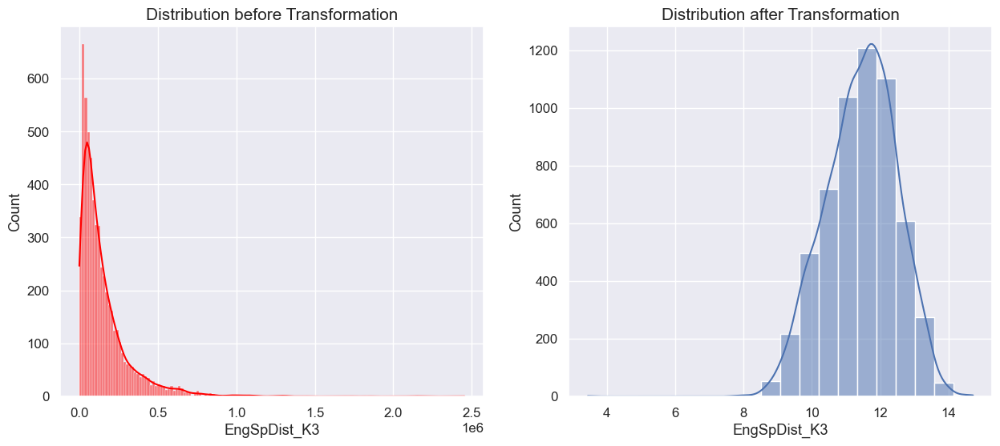

Skewness was 3.35 before & is -0.26 after Log transformation.
EngSpDist_K4


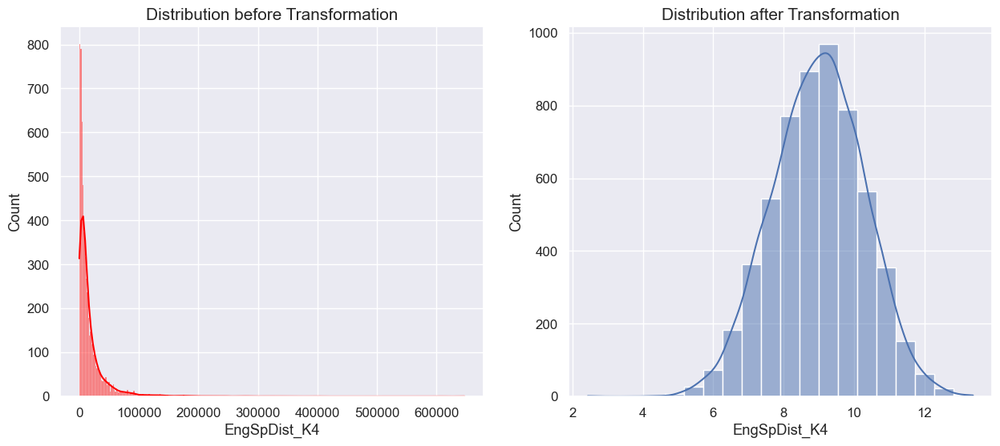

Skewness was 6.77 before & is -0.08 after Log transformation.
EngSpDist_K5


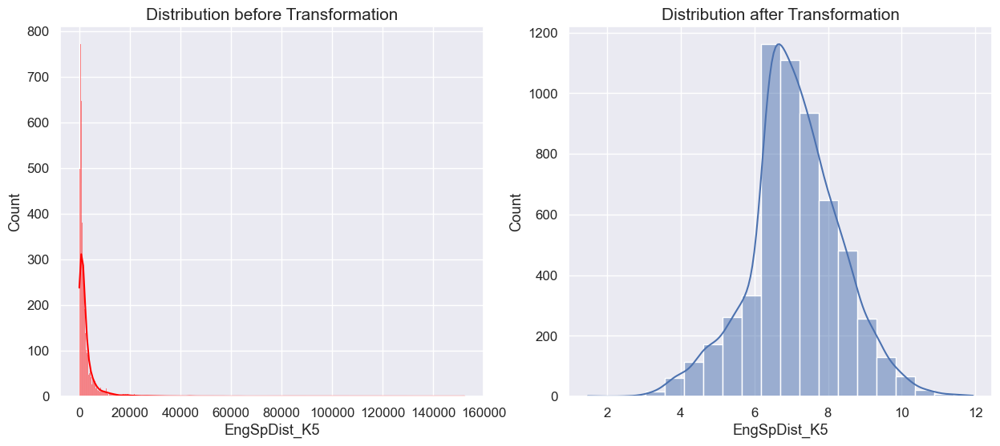

Skewness was 10.24 before & is -0.05 after Log transformation.
EngSpDist_K6


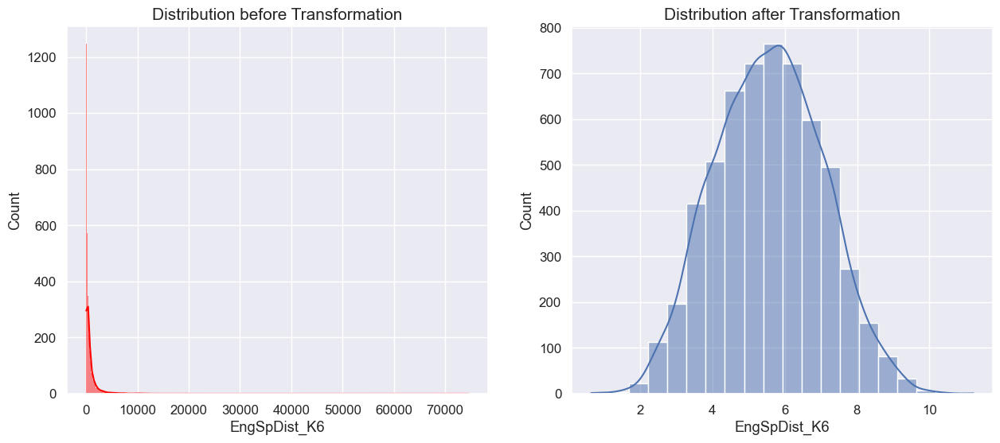

Skewness was 15.09 before & is 0.06 after Log transformation.
EngSpDist_K7


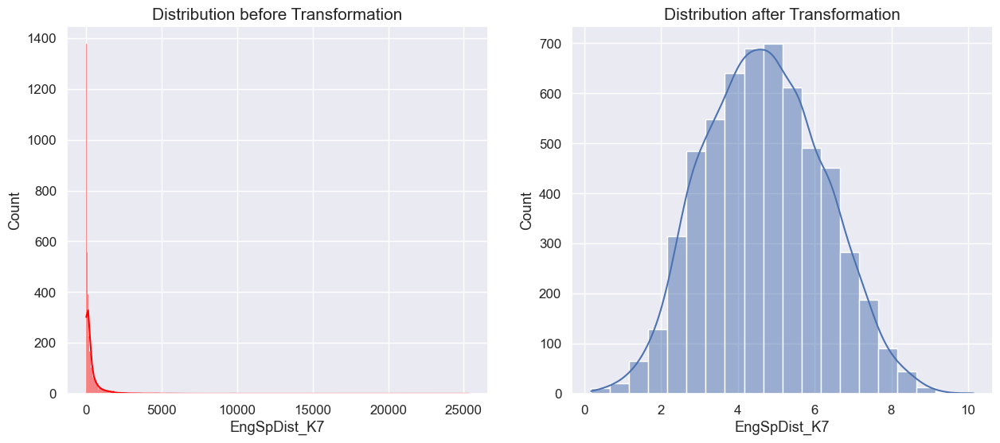

Skewness was 10.16 before & is 0.1 after Log transformation.
AmbTempDist_K5


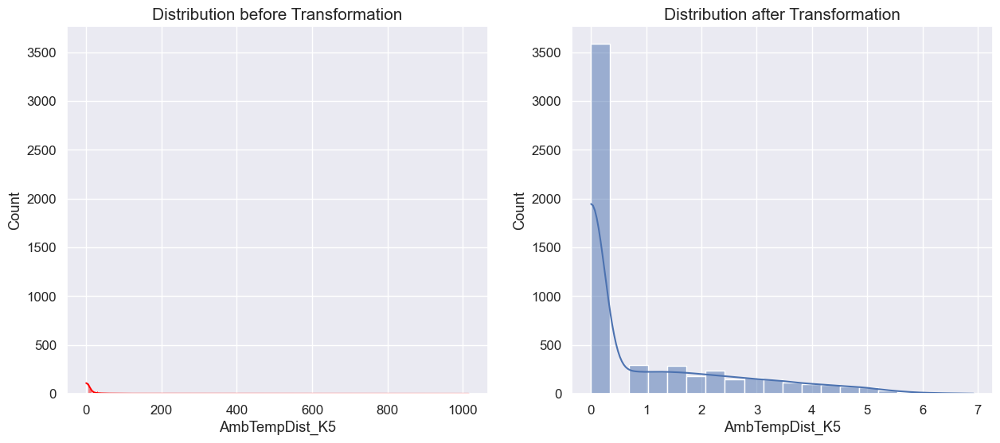

Skewness was 8.89 before & is 1.5 after Log transformation.
AmbTempDist_K6


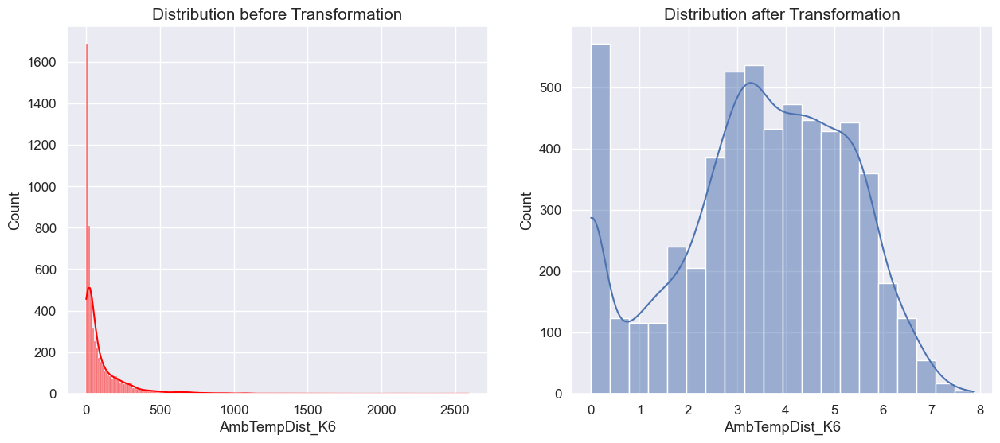

Skewness was 4.1 before & is -0.38 after Log transformation.
AmbTempDist_K7


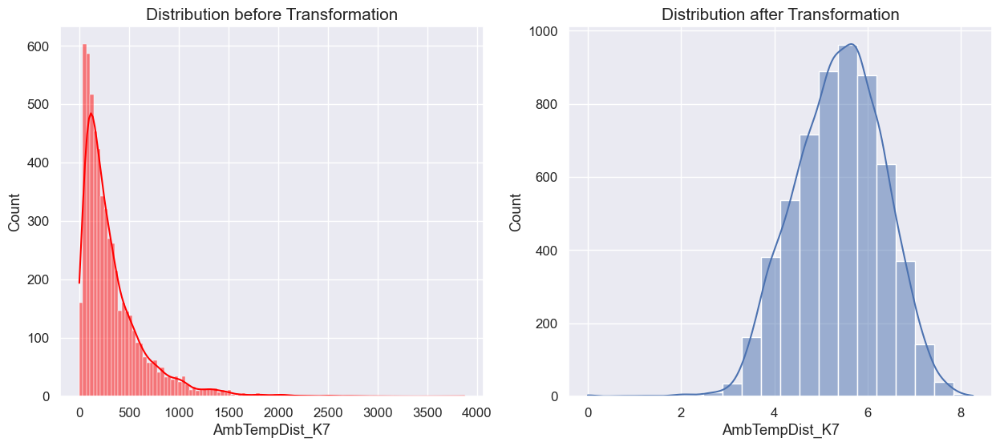

Skewness was 2.6 before & is -0.27 after Log transformation.
AmbTempDist_K8


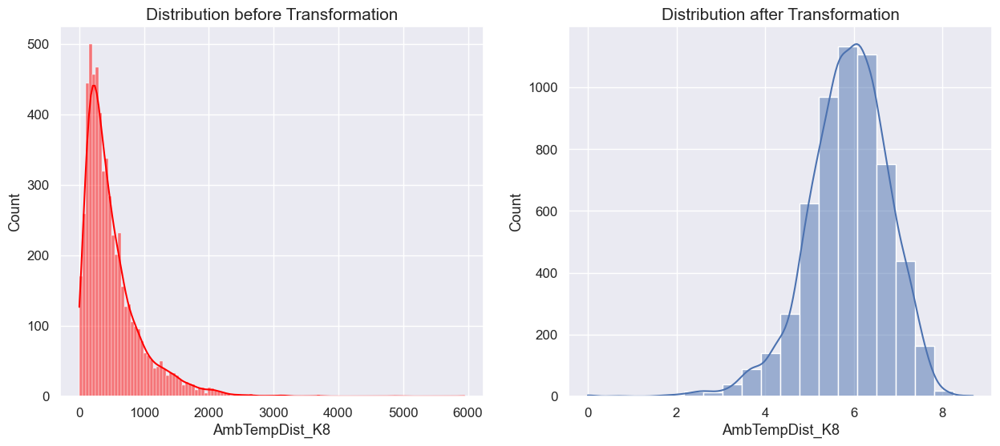

Skewness was 2.31 before & is -0.69 after Log transformation.
AmbTempDist_K9


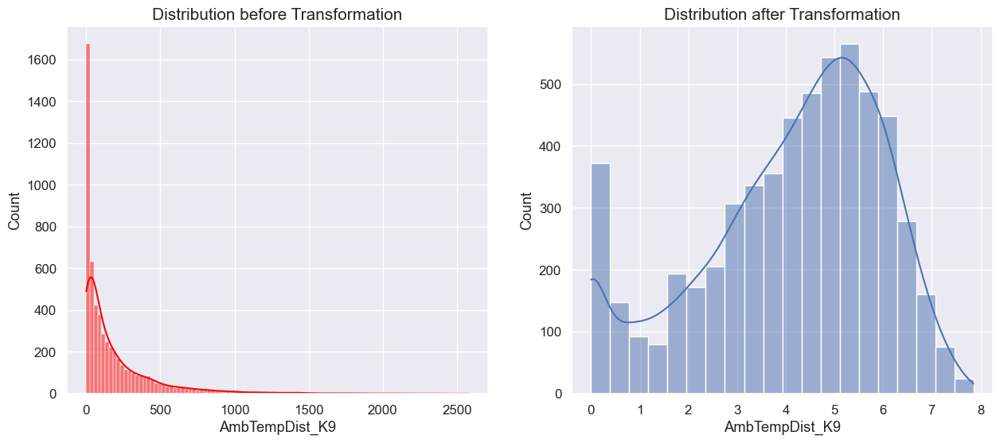

Skewness was 2.87 before & is -0.63 after Log transformation.
AmbTempDist_K10


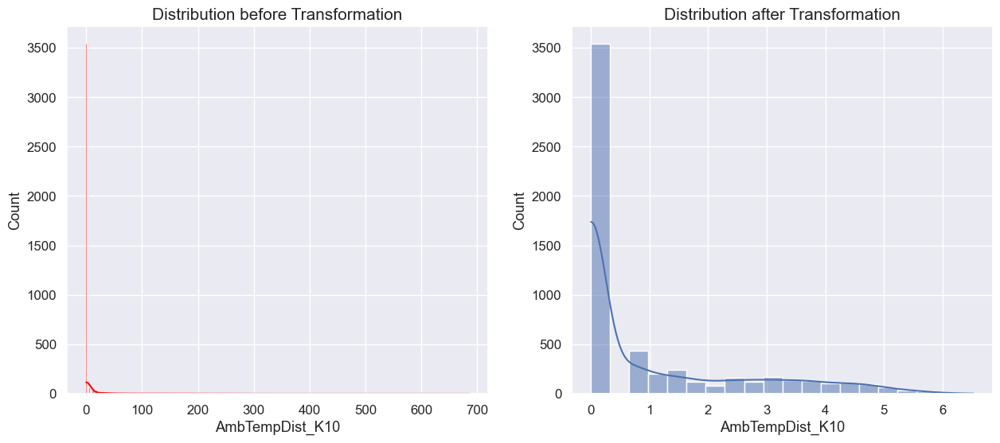

Skewness was 6.09 before & is 1.46 after Log transformation.
MILEAGE


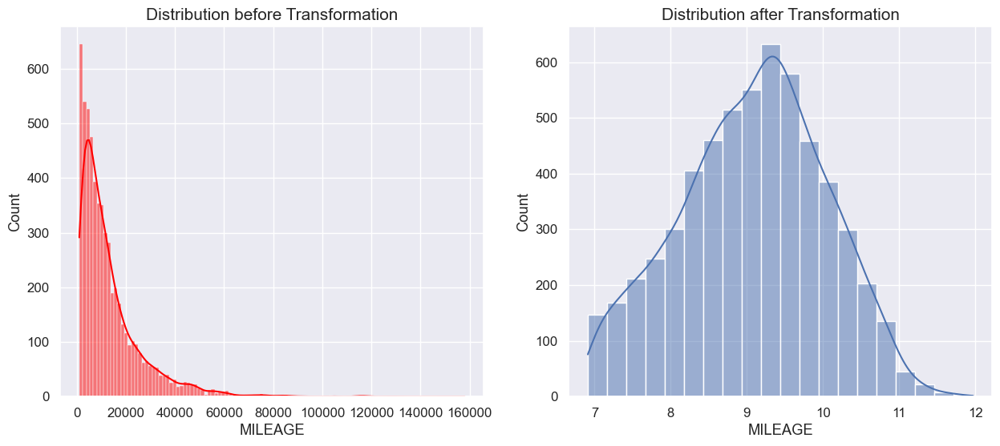

Skewness was 2.54 before & is -0.14 after Log transformation.
LABEL
SlopeAmbTempDist


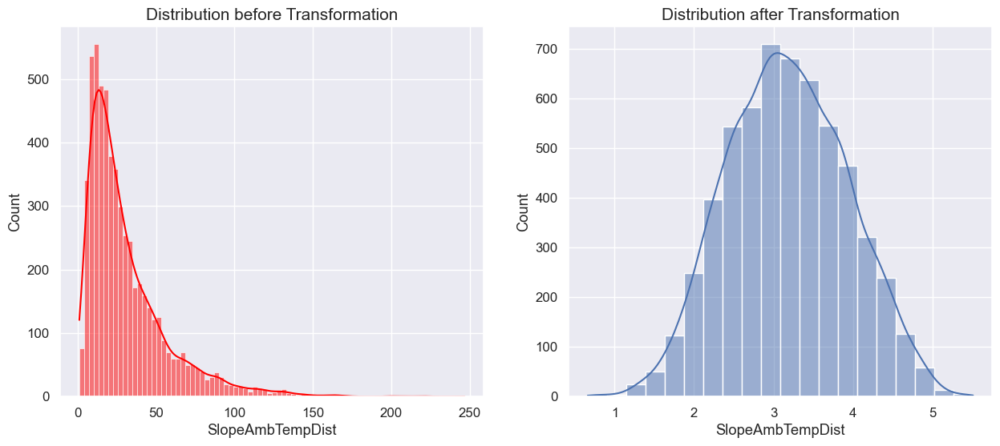

Skewness was 2.04 before & is 0.05 after Log transformation.


In [44]:
def logTrans(feature):   # function to apply transformer and check the distribution with histogram and kdeplot
    
    logTr = ColumnTransformer(transformers=[("lg", FunctionTransformer(np.log1p), [feature])])

    plt.figure(figsize=(15,6))
    plt.subplot(1,2,1)
    plt.title("Distribution before Transformation", fontsize=15)
    sns.histplot(df_features_dropped_correlation[feature], kde=True, color="red")
    plt.subplot(1,2,2)
    
    df_log = pd.DataFrame(logTr.fit_transform(df_features_dropped_correlation))
    plt.title("Distribution after Transformation", fontsize=15)
    sns.histplot(df_log,bins=20, kde=True , legend=False)
    plt.xlabel(feature)
    plt.show()
    
    print(f"Skewness was {round(old_skew[feature],2)} before & is {round(df_log.skew()[0],2)} after Log transformation.")

for f in df_features_dropped_correlation.keys():
    print(f)
    if f!='LABEL':
        logTrans(feature=f)

In [45]:
features = list(df_features_dropped_correlation.keys())
features.remove('LABEL')
print(features)

['TONDUR', 'EngSpDist_K1', 'EngSpDist_K2', 'EngSpDist_K3', 'EngSpDist_K4', 'EngSpDist_K5', 'EngSpDist_K6', 'EngSpDist_K7', 'AmbTempDist_K5', 'AmbTempDist_K6', 'AmbTempDist_K7', 'AmbTempDist_K8', 'AmbTempDist_K9', 'AmbTempDist_K10', 'MILEAGE', 'SlopeAmbTempDist']


In [82]:
len(features)

16

We can now transform that data. 

In [46]:
logTr = ColumnTransformer(transformers=[("lg", FunctionTransformer(np.log1p), features)])
df_log = pd.DataFrame(logTr.fit_transform(df_features_dropped_correlation))

In [47]:
df_log.columns = features

In [48]:
df_log['LABEL'] = df_features_dropped_correlation['LABEL']

In [49]:
df_log.shape

(5777, 17)

In [50]:
df_log['LABEL'] = df_log['LABEL'].map({'DAMAGE': 1, 'NO_DAMAGE': 0})

In [51]:
df_log.keys()

Index(['TONDUR', 'EngSpDist_K1', 'EngSpDist_K2', 'EngSpDist_K3',
       'EngSpDist_K4', 'EngSpDist_K5', 'EngSpDist_K6', 'EngSpDist_K7',
       'AmbTempDist_K5', 'AmbTempDist_K6', 'AmbTempDist_K7', 'AmbTempDist_K8',
       'AmbTempDist_K9', 'AmbTempDist_K10', 'MILEAGE', 'SlopeAmbTempDist',
       'LABEL'],
      dtype='object')

### Distribution with respect to the classes
We will look into the distribution of the data more closely to see the overlap between classes and if the classes look linearly seperable.

The following graphs represent the overall distribution of features across dependent variables. It looks that the data perfectly overlaps between two classes, i.e., linearly inseperable. For instance, **EngSpDist_K14** have the data points overlapped for both target variables, and similar the case for all of the features.

In [52]:
def histplot_helper(cols, df):
    # select the columns to be plotted
    #cols = list(df_log.keys())
    #cols.remove('LABEL')

    # create the figure and axes
    fig, axes = plt.subplots(2, 3)
    axes = axes.ravel()  # flattening the array makes indexing easier

    for col, ax in zip(cols, axes):
        sns.histplot(data=df_log, x = col, kde=True, stat='density', ax=ax, hue='LABEL')

    fig.tight_layout()
    plt.show()

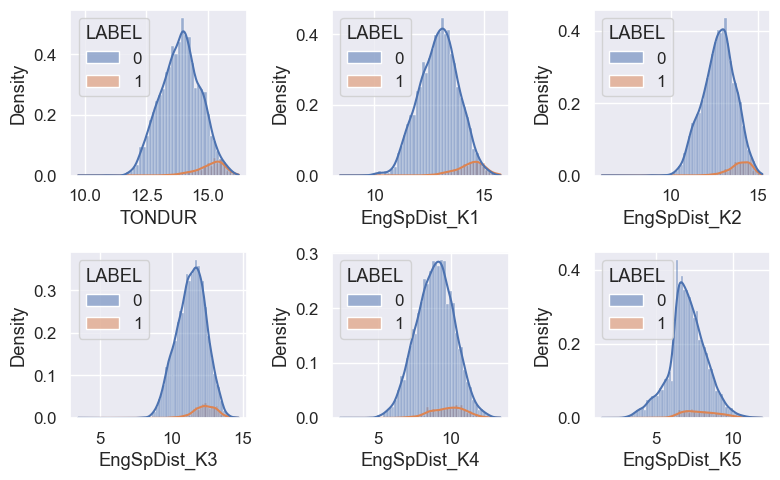

In [53]:
features = list(df_log.keys())
histplot_helper(features[0:6], df_log)

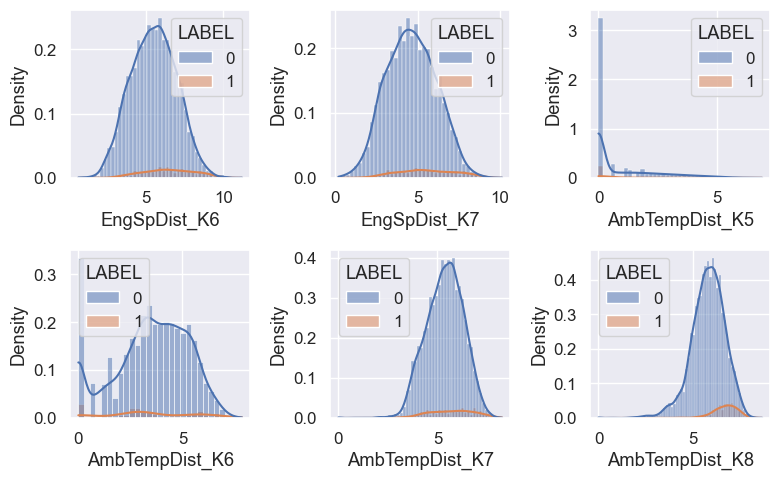

In [54]:
histplot_helper(features[6:12], df_log)

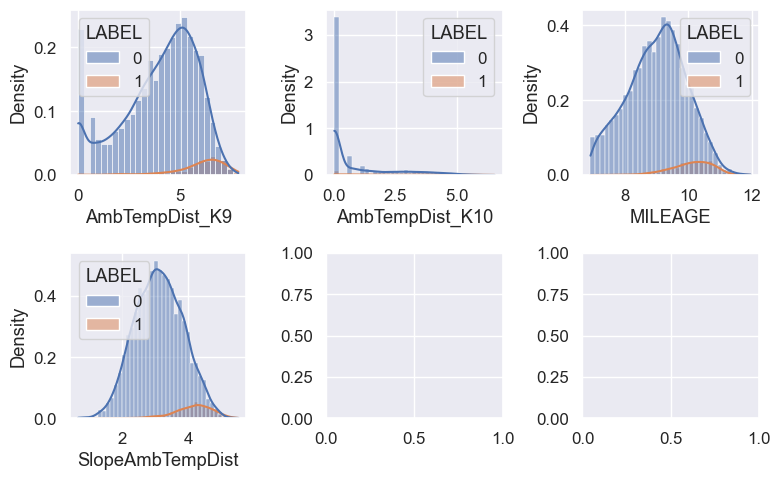

In [56]:
histplot_helper(features[12:16], df_log)

### PCA and Distribution Analysis
The following blocks of cells apply PCA feature reduction techniuqe by quantifying the variance of the features and selecting features with max variance explained.

The followng pairplots between principal components show that none of the components have the capability to seperate the classes. 

In [57]:
import plotly.express as px
from sklearn.decomposition import PCA

pca = PCA()
components = pca.fit_transform(df_log[features])
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(4),
    color=df_log["LABEL"]
)
fig.update_traces(diagonal_visible=False)
fig.show()

However we will continue with the modeling, preferably non-linear models, e.g., Support vector machines, ensemble methods to see if models perform well under various metrics.

### Feature Importance
In the following block we will look at top features through ***Random Forest*** that could be important for the modeling. For simplicity, I am only relying on RF at the moment but there are other techniques, e.g., SHAP, Permutation based method, etc.

In [63]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

In [68]:
features.remove('LABEL')

In [69]:
X = df_log[features].values
y = df_log['LABEL'].values

Well, that's **surprising**, only two features ***EngSpDist_K1*** and ***AmbTempDist_K9***, i.e., cut off, seem to be highly important. We can only consider these two for modeling and compare with the results with the all features, i.e., features selected after analysis, e.g., variance, correlation, missing data.

[0.03327645 0.30989301 0.04524543 0.03819207 0.04777376 0.03930032
 0.03504378 0.04926049 0.01993601 0.05261323 0.05062032 0.03837394
 0.11581186 0.04640767 0.04486041 0.03339125]


Text(0.5, 0, 'Random Forest Feature Importance')

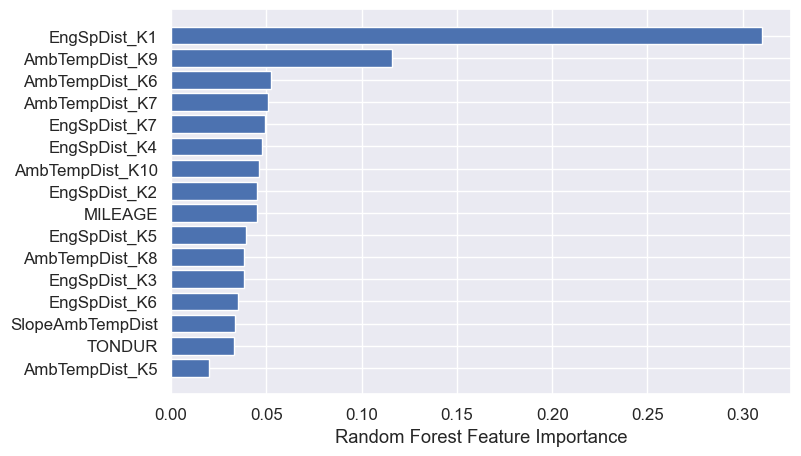

In [70]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=12)
rf = RandomForestRegressor(n_estimators=100)
rf.fit(X_train, y_train)
print(rf.feature_importances_)
sorted_idx = rf.feature_importances_.argsort()
plt.barh(list(map(features.__getitem__, sorted_idx)), rf.feature_importances_[sorted_idx])
plt.xlabel("Random Forest Feature Importance")

Let's confirm this with another method, i.e., permuation importance, and it looks we also got the same feature considered important through permuation method. As permutation method takes a trained model as an argument for testing data, it looks reasonable to consider these features important as our data is **highly imbalanced**. However, I will still include selected features after analysis and important features to compare the results and finalize the model.

Text(0.5, 0, 'Permutation Importance')

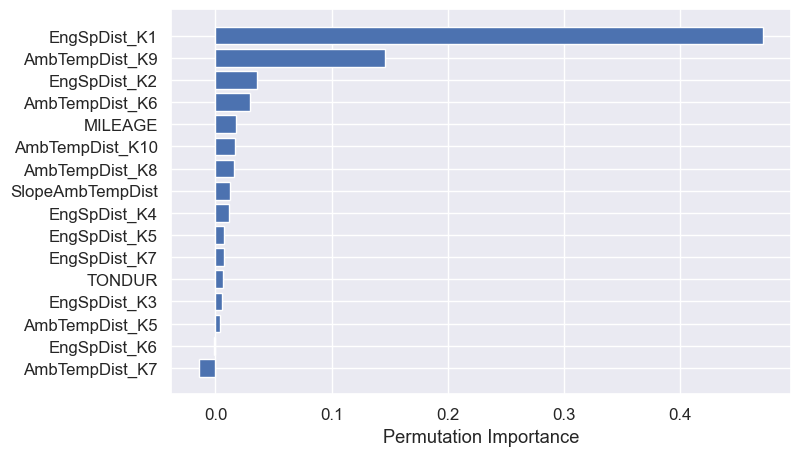

In [71]:
from sklearn.inspection import permutation_importance
perm_importance = permutation_importance(rf, X_test, y_test)
sorted_idx = perm_importance.importances_mean.argsort()
plt.barh(list(map(features.__getitem__, sorted_idx)), perm_importance.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")

I will now split the data into train and test so that we can keep the unseen data seperate and only work with training and validation data.

In [72]:
train, test = train_test_split(df_log, test_size=0.2)

In [73]:
train['LABEL'].value_counts(), test['LABEL'].value_counts()

(0    4355
 1     266
 Name: LABEL, dtype: int64,
 0    1086
 1      70
 Name: LABEL, dtype: int64)

In [74]:
train.shape, test.shape

((4621, 17), (1156, 17))

In [78]:
train.to_csv('./data/train_logged_transformed_data.csv')
test.to_csv('./data/test_logged_transformed_data.csv')

In [79]:
import pickle
filename = './models/log_model.sav'
pickle.dump(logTr, open(filename, 'wb'))

In [80]:
loaded_model_log = pickle.load(open('./models/log_model.sav', 'rb'))

In [81]:
loaded_model_log

ColumnTransformer(transformers=[('lg',
                                 FunctionTransformer(func=<ufunc 'log1p'>),
                                 ['TONDUR', 'EngSpDist_K1', 'EngSpDist_K2',
                                  'EngSpDist_K3', 'EngSpDist_K4',
                                  'EngSpDist_K5', 'EngSpDist_K6',
                                  'EngSpDist_K7', 'AmbTempDist_K5',
                                  'AmbTempDist_K6', 'AmbTempDist_K7',
                                  'AmbTempDist_K8', 'AmbTempDist_K9',
                                  'AmbTempDist_K10', 'MILEAGE',
                                  'SlopeAmbTempDist'])])